# Building and Optimizing Decision Tree Models for UFC Fight Outcome Prediction

In [1]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import pydotplus
from IPython.display import Image

# Load the dataset (ensure the file path is correct)
ufc_data_cleaned = pd.read_csv('../data/processed/ufc_fight_data_cleaned.csv')

# Encode target variable: 1 for Red win, 0 for Blue win
ufc_data_cleaned['red_wins'] = (ufc_data_cleaned['winner'] == 'Red').astype(int)

# Define features and target variable
features = [
    'kd_diff',                # Разница в нокдаунах
    'sig_str_diff',           # Разница в значимых ударах
    'sig_str_acc_diff',       # Разница в точности значимых ударов
    'td_diff',                # Разница в тейкдаунах
    'sub_att_diff',           # Разница в попытках сабмишенов
    'ctrl_sec_diff',          # Разница в времени контроля
    'height_diff',            # Разница в росте
    'reach_diff',             # Разница в размахе рук
    'SLpM_total_diff',        # Разница в значимых ударах за минуту
    'SApM_total_diff',        # Разница в пропущенных ударах за минуту
    'sig_str_acc_total_diff', # Разница в точности значимых ударов
    'td_acc_total_diff',      # Разница в общей точности тейкдаунов
    'td_def_total_diff',      # Разница в общей защите от тейкдаунов
    'sub_avg_diff',           # Разница в среднем количестве сабмишенов за бой
    'td_avg_diff'             # Разница в среднем количестве тейкдаунов за бой
]


X = ufc_data_cleaned[features]
y = ufc_data_cleaned['red_wins']

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Create an unpruned decision tree
clf = DecisionTreeClassifier(random_state=42)  # No constraints
clf.fit(X_train, y_train)

# Export the tree to Graphviz format
dot_data = export_graphviz(
    clf,
    out_file=None,
    feature_names=features,
    class_names=['Blue Win', 'Red Win'],
    filled=True,
    rounded=True,
    special_characters=True
)

# Convert to a graph
graph = pydotplus.graph_from_dot_data(dot_data)
graph.set_graph_defaults(fontsize='12', dpi='300')  # Set font size and DPI for better quality

# Create a directory to save the image if it doesn't exist
output_dir = 'output_tree_images'
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Save the image in the specified directory
output_path = os.path.join(output_dir, "decision_tree_output_graphviz_high_quality.png")
graph.write_png(output_path)


# Display in Jupyter Notebook (optional)
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.303199 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.303199 to fit



In [2]:
from sklearn.metrics import accuracy_score, f1_score, confusion_matrix, classification_report

# Предсказания на тестовых данных
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

# Расчет метрик
print("Train Accuracy:", accuracy_score(y_train, y_pred_train))
print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
print("Train F1-Score:", f1_score(y_train, y_pred_train))
print("Test F1-Score:", f1_score(y_test, y_pred_test))

# Матрица ошибок и отчет по классификации
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_test))
print("Classification Report:\n", classification_report(y_test, y_pred_test))


Train Accuracy: 0.9994238525062416
Test Accuracy: 0.8310931899641577
Train F1-Score: 0.9995604395604396
Test F1-Score: 0.8701343437822942
Confusion Matrix:
 [[ 592  176]
 [ 201 1263]]
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.77      0.76       768
           1       0.88      0.86      0.87      1464

    accuracy                           0.83      2232
   macro avg       0.81      0.82      0.81      2232
weighted avg       0.83      0.83      0.83      2232



### Explanation of Train-Test Split in Code

Purpose: Splitting the dataset is crucial for evaluating the performance of machine learning models. It helps us assess how well the model generalizes to new, unseen data.

In [3]:
# Проверка на наличие NaN
print(X_train.isnull().sum().sum(), "missing values in X_train")
print(X_test.isnull().sum().sum(), "missing values in X_test")


725 missing values in X_train
313 missing values in X_test


In [4]:
from sklearn.impute import SimpleImputer
from imblearn.over_sampling import SMOTE

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# Обработка NaN: заполнение средним значением
imputer = SimpleImputer(strategy='mean')
X_train = pd.DataFrame(imputer.fit_transform(X_train), columns=X_train.columns)
X_test = pd.DataFrame(imputer.transform(X_test), columns=X_test.columns)

# Проверка, что NaN устранены
print(X_train.isnull().sum().sum(), "missing values in X_train")  # Должно быть 0
print(X_test.isnull().sum().sum(), "missing values in X_test")    # Должно быть 0

# Применение SMOTE для балансировки
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

# Обучение модели на сбалансированном наборе
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_resampled, y_resampled)

# Оценка модели на тестовом наборе
y_pred = clf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=['Blue Wins', 'Red Wins']))

0 missing values in X_train
0 missing values in X_test
Classification Report:
               precision    recall  f1-score   support

   Blue Wins       0.74      0.74      0.74       513
    Red Wins       0.86      0.86      0.86       975

    accuracy                           0.82      1488
   macro avg       0.80      0.80      0.80      1488
weighted avg       0.82      0.82      0.82      1488



In [5]:
feature_importances = pd.DataFrame({
    'Feature': features,
    'Importance': clf.feature_importances_
}).sort_values(by='Importance', ascending=False)
print(feature_importances)


                   Feature  Importance
1             sig_str_diff    0.440213
5            ctrl_sec_diff    0.103386
4             sub_att_diff    0.102042
0                  kd_diff    0.094624
12       td_def_total_diff    0.030649
8          SLpM_total_diff    0.029900
10  sig_str_acc_total_diff    0.026505
11       td_acc_total_diff    0.025369
2         sig_str_acc_diff    0.025352
13            sub_avg_diff    0.025341
3                  td_diff    0.022226
7               reach_diff    0.021768
14             td_avg_diff    0.019511
9          SApM_total_diff    0.019054
6              height_diff    0.014060


In [7]:
from sklearn.metrics import accuracy_score, f1_score, classification_report

# Обучение модели
clf = DecisionTreeClassifier(random_state=42, max_depth=5)
clf.fit(X_train, y_train)

# Предсказания
y_train_pred = clf.predict(X_train)  # Предсказания на тренировочных данных
y_test_pred = clf.predict(X_test)    # Предсказания на тестовых данных

# Вычисление метрик для обучающих данных
train_accuracy = accuracy_score(y_train, y_train_pred)
train_f1 = f1_score(y_train, y_train_pred)

# Вычисление метрик для тестовых данных
test_accuracy = accuracy_score(y_test, y_test_pred)
test_f1 = f1_score(y_test, y_test_pred)

# Печать метрик
print("Train Accuracy:", train_accuracy)
print("Train F1-Score:", train_f1)
print("Test Accuracy:", test_accuracy)
print("Test F1-Score:", test_f1)

# Дополнительно: подробный отчёт
print("\nClassification Report (Test):\n", classification_report(y_test, y_test_pred))


Train Accuracy: 0.8763233070072257
Train F1-Score: 0.9065278130556261
Test Accuracy: 0.8682795698924731
Test F1-Score: 0.8998978549540347

Classification Report (Test):
               precision    recall  f1-score   support

           0       0.81      0.80      0.81       513
           1       0.90      0.90      0.90       975

    accuracy                           0.87      1488
   macro avg       0.86      0.85      0.85      1488
weighted avg       0.87      0.87      0.87      1488



### Explanation of Model Creation, Training, and Evaluation


1. **Model Creation**:
   - `clf = DecisionTreeClassifier(random_state=42)` creates an instance of a decision tree classifier with a specified `random_state` for reproducibility.
   
2. **Training the Model**:
   - `clf.fit(X_train, y_train)` trains the model using the training data (`X_train` as features and `y_train` as targets). During training, the model learns patterns from the data to make predictions.

3. **Making Predictions**:
   - `y_pred_train = clf.predict(X_train)` makes predictions on the training data to evaluate how well the model has learned the data it was trained on.
   - `y_pred_test = clf.predict(X_test)` makes predictions on the test data to assess how well the model generalizes to unseen data.

4. **Performance Metrics**:
   - **Train Accuracy** and **Test Accuracy** are calculated using `accuracy_score()`, which measures the proportion of correctly predicted instances out of the total instances.
   - **Train F1-Score** and **Test F1-Score** are calculated using `f1_score()`, providing a balance between precision and recall. It is particularly useful when there is class imbalance.


In [42]:
# Create the model and train it
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions on training and testing sets
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

# Calculate and display performance metrics
print("Train Accuracy:", accuracy_score(y_train, y_pred_train))
print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
print("Train F1-Score:", f1_score(y_train, y_pred_train))
print("Test F1-Score:", f1_score(y_test, y_pred_test))


Train Accuracy: 1.0
Test Accuracy: 0.8131720430107527
Train F1-Score: 1.0
Test F1-Score: 0.857727737973388


### Explanation of Training an Unpruned Decision Tree




1. **Model Creation**:
   - `clf_unpruned = DecisionTreeClassifier(random_state=42)` creates a decision tree classifier without specifying any constraints such as maximum depth or minimum samples per leaf. This means the tree is unpruned and can grow to its full complexity, fitting the training data as closely as possible.

2. **Training the Model**:
   - `clf_unpruned.fit(X_train, y_train)` trains the model on the training data, learning from all available features and outcomes.

3. **Performance Evaluation**:
   - **Training Accuracy**: The accuracy of predictions on the training data. A very high training accuracy (close to 100%) suggests that the model has fit the training data very well.
   - **Testing Accuracy**: The accuracy of predictions on the test data. If there is a large drop between training accuracy and test accuracy, it could indicate that the model is overfitting—meaning it has learned the training data too well and is not generalizing well to new data.



In [43]:
# Create and train an unpruned decision tree
clf_unpruned = DecisionTreeClassifier(random_state=42)
clf_unpruned.fit(X_train, y_train)

# Evaluate the model's performance
print("Unpruned Tree - Train Accuracy:", accuracy_score(y_train, clf_unpruned.predict(X_train)))
print("Unpruned Tree - Test Accuracy:", accuracy_score(y_test, clf_unpruned.predict(X_test)))


Unpruned Tree - Train Accuracy: 1.0
Unpruned Tree - Test Accuracy: 0.8131720430107527


### Explanation of Training a Pruned Decision Tree with Specified Maximum Depth



1. **Model Creation with Pruning**:
   - `clf_pruned = DecisionTreeClassifier(max_depth=5, random_state=42)` creates a decision tree classifier with the constraint that the maximum depth of the tree is 5. This pruning parameter limits the depth of the tree, thereby reducing its complexity. The `random_state=42` ensures reproducibility of results.

2. **Training the Model**:
   - `clf_pruned.fit(X_train, y_train)` trains the decision tree using the training data. The maximum depth restriction means that the tree will not grow beyond 5 levels, which helps to control overfitting by simplifying the model.

3. **Performance Evaluation**:
   - The `accuracy_score()` function is used to calculate the accuracy of the model's predictions on both the training and test datasets.
     - **Train Accuracy** indicates how well the model fits the training data.
     - **Test Accuracy** indicates how well the model generalizes to unseen data (test data).
   - By comparing these metrics, you can gauge how effective the pruning is in preventing overfitting.


In [6]:
# Create and train a pruned decision tree with a maximum depth of 5
clf_pruned = DecisionTreeClassifier(
    max_depth=7,
    min_samples_split=10,
    min_samples_leaf=5,
    random_state=42
)
clf_pruned.fit(X_train, y_train)

# Evaluate the model's performance
print("Pruned Tree (max_depth=5) - Train Accuracy:", accuracy_score(y_train, clf_pruned.predict(X_train)))
print("Pruned Tree (max_depth=5) - Test Accuracy:", accuracy_score(y_test, clf_pruned.predict(X_test)))


Pruned Tree (max_depth=5) - Train Accuracy: 0.8973281801377919
Pruned Tree (max_depth=5) - Test Accuracy: 0.8702956989247311


### Explanation of Training a Decision Tree Using Gini Impurity



1. **Model Creation with Gini Impurity**:
   - `clf_gini = DecisionTreeClassifier(criterion='gini', random_state=42)` creates a decision tree classifier with the Gini impurity criterion for measuring the quality of splits at each node. The `random_state=42` ensures reproducibility.
   - **Gini Impurity** is a measure of how often a randomly chosen element would be incorrectly labeled if it was randomly labeled according to the distribution of labels in the node. Lower values of Gini impurity indicate better splits.

2. **Training the Model**:
   - `clf_gini.fit(X_train, y_train)` trains the decision tree using the training data (`X_train` as features and `y_train` as target labels). The tree uses Gini impurity as the criterion for deciding how to split data at each node.

3. **Performance Evaluation**:
   - **Train Accuracy**: The accuracy of the model's predictions on the training data.
   - **Test Accuracy**: The accuracy of the model's predictions on the test data (new, unseen data).
   - By comparing training and test accuracies, you can determine whether the model is overfitting (performing very well on training data but poorly on test data) or underfitting (performing poorly on both).



In [45]:
# Create and train a decision tree using the Gini impurity criterion
clf_gini = DecisionTreeClassifier(criterion='gini', random_state=42)
clf_gini.fit(X_train, y_train)

# Evaluate the model's performance
print("Gini - Train Accuracy:", accuracy_score(y_train, clf_gini.predict(X_train)))
print("Gini - Test Accuracy:", accuracy_score(y_test, clf_gini.predict(X_test)))


Gini - Train Accuracy: 1.0
Gini - Test Accuracy: 0.8131720430107527


In [46]:
# Create and train a decision tree using the Gini impurity criterion with pruning (max depth = 5)
clf_gini_pruned = DecisionTreeClassifier(criterion='gini', max_depth=5, random_state=42)
clf_gini_pruned.fit(X_train, y_train)

# Evaluate the model's performance
print("Gini (Pruned - max_depth=5) - Train Accuracy:", accuracy_score(y_train, clf_gini_pruned.predict(X_train)))
print("Gini (Pruned - max_depth=5) - Test Accuracy:", accuracy_score(y_test, clf_gini_pruned.predict(X_test)))


Gini (Pruned - max_depth=5) - Train Accuracy: 0.8805454196274246
Gini (Pruned - max_depth=5) - Test Accuracy: 0.8660394265232975


### Explanation of Training a Decision Tree Using Entropy



1. **Model Creation with Entropy**:
   - `clf_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)` creates a decision tree classifier with the `entropy` criterion. The `random_state=42` parameter ensures reproducibility of the results.
   - **Entropy** is a measure of information gain, which quantifies the impurity or disorder in a dataset. When splitting nodes, the decision tree selects splits that maximize information gain (i.e., reduce entropy) to create purer subsets.

2. **Training the Model**:
   - `clf_entropy.fit(X_train, y_train)` trains the decision tree on the training data using entropy as the criterion for deciding splits at each node. This means that the tree tries to reduce the overall disorder or randomness in the classes at each split.

3. **Performance Evaluation**:
   - **Train Accuracy**: This metric indicates how accurately the model predicts the classes of the training data.
   - **Test Accuracy**: This metric shows how well the model generalizes to unseen data.
   - Comparing the train and test accuracies helps to evaluate whether the model is overfitting (if there is a large gap between train and test accuracy) or underfitting (if both accuracies are low).



In [47]:
# Create and train a decision tree using the Entropy criterion
clf_entropy = DecisionTreeClassifier(criterion='entropy', random_state=42)
clf_entropy.fit(X_train, y_train)

# Evaluate the model's performance
print("Entropy - Train Accuracy:", accuracy_score(y_train, clf_entropy.predict(X_train)))
print("Entropy - Test Accuracy:", accuracy_score(y_test, clf_entropy.predict(X_test)))


Entropy - Train Accuracy: 1.0
Entropy - Test Accuracy: 0.817652329749104


In [48]:
# Create and train a decision tree using the Entropy criterion with max depth
clf_entropy_pruned = DecisionTreeClassifier(criterion='entropy', max_depth=5, random_state=42)
clf_entropy_pruned.fit(X_train, y_train)

# Evaluate the pruned model's performance
print("Entropy (Pruned - max_depth=5) - Train Accuracy:", accuracy_score(y_train, clf_entropy_pruned.predict(X_train)))
print("Entropy (Pruned - max_depth=5) - Test Accuracy:", accuracy_score(y_test, clf_entropy_pruned.predict(X_test)))


Entropy (Pruned - max_depth=5) - Train Accuracy: 0.8550028807374688
Entropy (Pruned - max_depth=5) - Test Accuracy: 0.8512544802867383



### Explanation of Using Cross-Validation for Model Evaluation


1. **Cross-Validation Setup**:
   - `cross_val_score(clf_cv, X, y, cv=5)` splits the dataset into 5 equal-sized folds (parts). It trains the model on 4 folds and tests it on the remaining fold, repeating this process 5 times so that each fold serves as the test set once. The scores from all iterations are returned as an array.
   - The parameter `cv=5` specifies that we are using 5-fold cross-validation, which is a common choice for evaluating models as it provides a good trade-off between bias and variance of the estimate.

2. **Model Creation**:
   - `clf_cv = DecisionTreeClassifier(random_state=42)` creates a decision tree classifier with a specified random state for reproducibility.
   
3. **Performance Evaluation**:
   - **`scores`**: This is an array containing the accuracy scores for each of the 5 folds.
   - **`scores.mean()`**: This calculates the mean accuracy across all folds, providing an estimate of the model's overall generalization performance.



In [49]:
from sklearn.model_selection import cross_val_score

clf_cv = DecisionTreeClassifier(random_state=42)
scores = cross_val_score(clf_cv, X, y, cv=5)  # 5-fold кросс-валидация

print("Cross-Validation Scores:", scores)
print("Mean CV Accuracy:", scores.mean())


Cross-Validation Scores: [0.79905914 0.82392473 0.8266129  0.81182796 0.81977135]
Mean CV Accuracy: 0.8162392165795316


In [50]:
clf_cv.fit(X, y)
importances = pd.DataFrame({
    'Feature': features,
    'Importance': clf_cv.feature_importances_
}).sort_values(by='Importance', ascending=False)
print(importances)


                   Feature  Importance
1             sig_str_diff    0.435364
5            ctrl_sec_diff    0.108460
4             sub_att_diff    0.074078
0                  kd_diff    0.062927
12       td_def_total_diff    0.043767
9          SApM_total_diff    0.035282
10  sig_str_acc_total_diff    0.029297
7               reach_diff    0.029088
11       td_acc_total_diff    0.028616
14             td_avg_diff    0.028487
8          SLpM_total_diff    0.028074
3                  td_diff    0.027659
2         sig_str_acc_diff    0.026753
13            sub_avg_diff    0.023156
6              height_diff    0.018993


Class distribution:
 red_wins
1    4876
0    2563
Name: count, dtype: int64


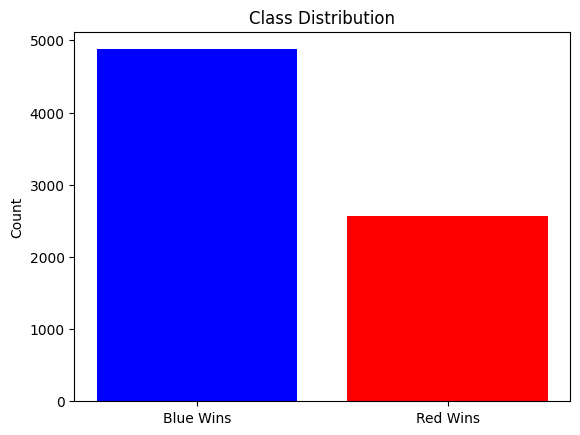

In [66]:
import matplotlib.pyplot as plt

# Распределение классов
class_counts = y.value_counts()
print("Class distribution:\n", class_counts)

# Визуализация распределения
plt.bar(['Blue Wins', 'Red Wins'], class_counts, color=['blue', 'red'])
plt.title('Class Distribution')
plt.ylabel('Count')
plt.show()


In [65]:
from sklearn.metrics import classification_report

y_pred = clf_cv.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=['Blue Wins', 'Red Wins']))
print("Train size:", len(X_train))
print("Test size:", len(X_test))
train_set = pd.concat([X_train, y_train], axis=1)
test_set = pd.concat([X_test, y_test], axis=1)
common = pd.merge(train_set, test_set, how='inner')
print("Common rows between train and test:", len(common))
print("Test class distribution:\n", y_test.value_counts())
from sklearn.model_selection import cross_val_score

scores = cross_val_score(clf, X, y, cv=5, scoring='accuracy')
print("Cross-Validation Scores:", scores)
print("Mean CV Accuracy:", scores.mean())


Classification Report:
               precision    recall  f1-score   support

   Blue Wins       0.97      0.99      0.98       769
    Red Wins       1.00      0.99      0.99      1463

    accuracy                           0.99      2232
   macro avg       0.99      0.99      0.99      2232
weighted avg       0.99      0.99      0.99      2232

Train size: 5207
Test size: 2232
Common rows between train and test: 1524193
Test class distribution:
 red_wins
1    1463
0     769
Name: count, dtype: int64
Cross-Validation Scores: [0.79905914 0.82392473 0.8266129  0.81182796 0.81977135]
Mean CV Accuracy: 0.8162392165795316


Classification Report:
               precision    recall  f1-score   support

   Blue Wins       0.74      0.71      0.73       769
    Red Wins       0.85      0.87      0.86      1463

    accuracy                           0.82      2232
   macro avg       0.80      0.79      0.79      2232
weighted avg       0.81      0.82      0.82      2232

Confusion Matrix:
 [[ 547  222]
 [ 188 1275]]


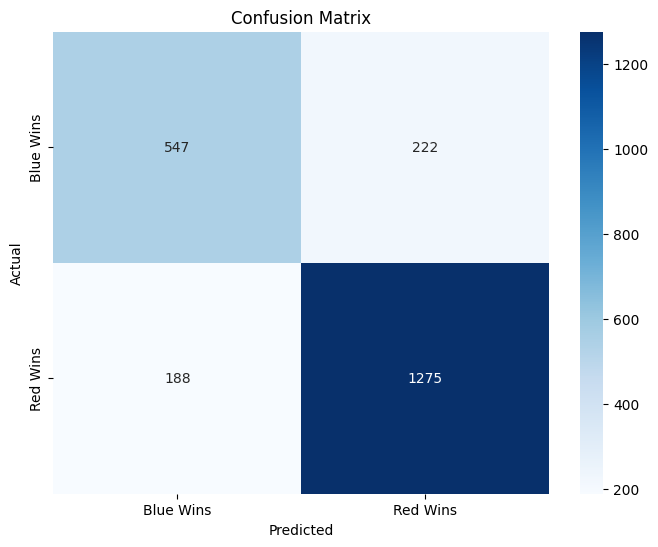

In [71]:
# Обучение Decision Tree с class_weight='balanced'
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix

clf_balanced = DecisionTreeClassifier(random_state=42, class_weight='balanced')
clf_balanced.fit(X_train, y_train)

# Оценка модели
y_pred = clf_balanced.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred, target_names=['Blue Wins', 'Red Wins']))

# Матрица ошибок
conf_matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", conf_matrix)

# Визуализация матрицы ошибок
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['Blue Wins', 'Red Wins'], yticklabels=['Blue Wins', 'Red Wins'])
plt.title("Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [72]:
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score

y_pred_test = clf.predict(X_test)  # Получаем предсказания на тестовом наборе
print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
print("Test F1-Score:", f1_score(y_test, y_pred_test))
print("Test Precision:", precision_score(y_test, y_pred_test))
print("Test Recall:", recall_score(y_test, y_pred_test))


Test Accuracy: 0.821236559139785
Test F1-Score: 0.8620808848945731
Test Precision: 0.872027972027972
Test Recall: 0.8523581681476419


In [73]:
from joblib import dump

# Сохранение модели на диск
dump(clf, 'decision_tree_model.joblib')  # Укажите имя файла
print("Модель сохранена как 'decision_tree_model.joblib'")


Модель сохранена как 'decision_tree_model.joblib'
